# EfficientSAM3 ARM Inference Test

This notebook demonstrates how to use EfficientSAM3 on ARM devices (Apple Silicon) for image segmentation.

**Key Features:**
- ✅ ARM-optimized (Apple Silicon MPS support)
- ✅ No CUDA/Triton dependencies
- ✅ Text-based grounding
- ✅ Bounding box prompts
- ✅ Multi-object detection

## 1. Setup and Imports

First, let's import the required libraries and check our device availability.

In [1]:
import os
import sys
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings

warnings.filterwarnings('ignore')

# Check device availability
print("🖥️  Device Availability:")
print(f"   CPU: Available")
print(f"   CUDA: {'Available' if torch.cuda.is_available() else 'Not available'}")
print(f"   MPS: {'Available' if torch.backends.mps.is_available() else 'Not available'}")
print(f"\n📦 PyTorch version: {torch.__version__}")

🖥️  Device Availability:
   CPU: Available
   CUDA: Not available
   MPS: Available

📦 PyTorch version: 2.9.1


## 2. Select Device

Choose the best available device for inference.

In [2]:
# Auto-select best device
if torch.backends.mps.is_available():
    device = "mps"
    print("✅ Using Apple Silicon MPS acceleration")
elif torch.cuda.is_available():
    device = "cuda"
    print(f"✅ Using CUDA GPU: {torch.cuda.get_device_name(0)}")
else:
    device = "cpu"
    print("✅ Using CPU")

print(f"\nSelected device: {device}")

✅ Using Apple Silicon MPS acceleration

Selected device: mps


## 3. Load the Model

Load the EfficientSAM3 model with the ARM-optimized builder.

In [3]:
from efficientsam3_arm.model_builder_arm import build_efficientsam3_image_model
from efficientsam3_arm.model.sam3_image_processor import Sam3Processor

# Model configuration
checkpoint_path = "weights/efficient_sam3_repvit-m0_9_mobileclip_s1.pth"
backbone_type = "repvit"
model_name = "m0_9"

print("🏗️  Building EfficientSAM3 model...")
print(f"   Checkpoint: {checkpoint_path}")
print(f"   Backbone: {backbone_type}/{model_name}")
print(f"   Device: cpu")
print(f"   Instance interactivity: Disabled (using grounding mode)")
print("\nThis may take a moment...\n")

# Load model with text encoder
# Note: enable_inst_interactivity=False for pure grounding/detection
# Set to True if you need SAM-style point/box interactive segmentation
model = build_efficientsam3_image_model(
    checkpoint_path=checkpoint_path,
    backbone_type=backbone_type,
    model_name=model_name,
    text_encoder_type="MobileCLIP-S1",
    device="cpu",
    enable_inst_interactivity=False,  # Set to True for SAM-style interactive segmentation
)

print("✅ Model loaded successfully!")

🏗️  Building EfficientSAM3 model...
   Checkpoint: weights/efficient_sam3_repvit-m0_9_mobileclip_s1.pth
   Backbone: repvit/m0_9
   Device: cpu
   Instance interactivity: Disabled (using grounding mode)

This may take a moment...

✅ Model loaded successfully!


In [20]:
image = Image.open("road.jpg").convert("RGB")

In [35]:
# Process image and predict with text prompt
print("🔧 Setting up processor with CPU device...")
processor = Sam3Processor(model=model, device="cpu", confidence_threshold=0.2)

# Verify model device
sample_param = next(model.parameters())
print(f"✅ Model device: {sample_param.device}")
print(f"✅ Processor device: {processor.device}")

print("\n🖼️  Processing image...")
inference_state = processor.set_image(image)

print("🔍 Running inference with text prompt 'shoe'...")
inference_state = processor.set_text_prompt(state=inference_state, prompt="human leg and hands")

print("🎭 Getting masks and scores...")
# Get results directly from the inference state
masks = inference_state["masks"].cpu().numpy()
boxes = inference_state["boxes"].cpu().numpy()
scores = inference_state["scores"].cpu().numpy()

print(f"\n✅ Inference complete!")
print(f"   Found {len(masks)} object(s)")
print(f"   Scores: {scores}")
print(f"   Boxes shape: {boxes.shape}")
print(f"   Masks shape: {masks.shape}")

🔧 Setting up processor with CPU device...
✅ Model device: cpu
✅ Processor device: cpu

🖼️  Processing image...
🔍 Running inference with text prompt 'shoe'...
🎭 Getting masks and scores...

✅ Inference complete!
   Found 41 object(s)
   Scores: [0.29007798 0.22772267 0.269226   0.20474267 0.24518171 0.24831733
 0.25924006 0.25882447 0.29890528 0.23201126 0.24664602 0.24808733
 0.21860845 0.25164837 0.27012637 0.26995403 0.22785667 0.22383821
 0.21082775 0.27457014 0.23966546 0.35710678 0.30699342 0.20734058
 0.20886388 0.22474211 0.24857487 0.2946128  0.2581822  0.20357046
 0.24756491 0.24714875 0.25093848 0.2049532  0.27320576 0.21379986
 0.29397106 0.24407081 0.26883954 0.2808473  0.23837863]
   Boxes shape: (41, 4)
   Masks shape: (41, 1, 1667, 2500)



🖼️  Visualizing results...
found 41 object(s)


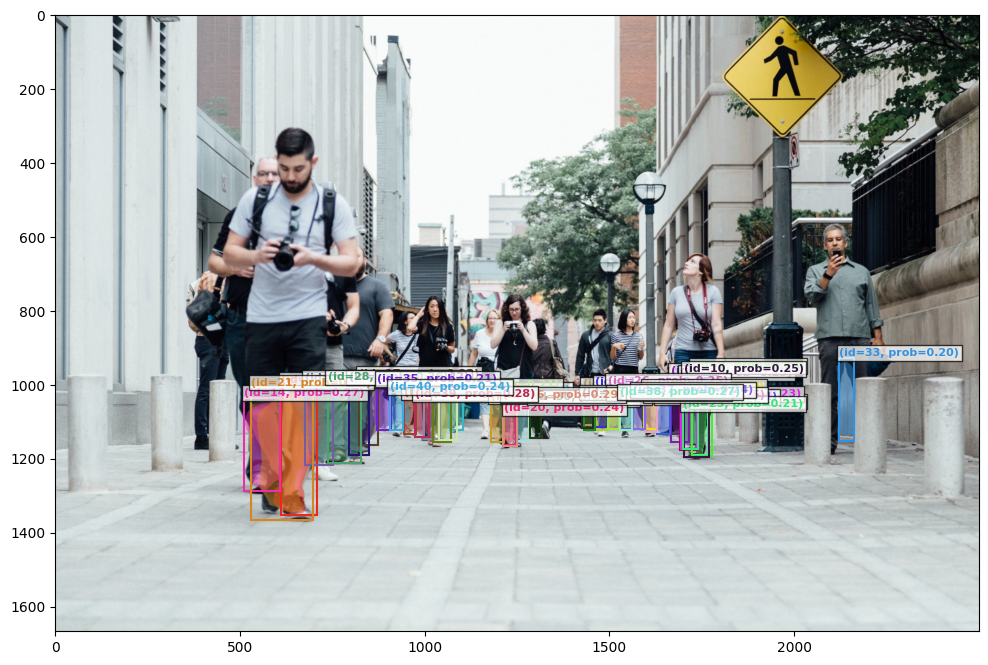

In [36]:
from efficientsam3_arm.visualization_utils.visualization_utils import draw_box_on_image, normalize_bbox, plot_results

# Visualize results
print("\n🖼️  Visualizing results...")
plot_results(image, inference_state)


In [9]:
# Process image and predict with text prompt
print("🔧 Setting up processor with CPU device...")
processor = Sam3Processor(model=model, device="cpu", confidence_threshold=0.2)

# Verify model device
sample_param = next(model.parameters())
print(f"✅ Model device: {sample_param.device}")
print(f"✅ Processor device: {processor.device}")

print("\n🖼️  Processing image...")
inference_state = processor.set_image(image)

print("🔍 Running inference with text prompt 'shoe'...")
inference_state = processor.set_text_prompt(state=inference_state, prompt="person")

print("🎭 Getting masks and scores...")
# Get results directly from the inference state
masks = inference_state["masks"].cpu().numpy()
boxes = inference_state["boxes"].cpu().numpy()
scores = inference_state["scores"].cpu().numpy()

print(f"\n✅ Inference complete!")
print(f"   Found {len(masks)} object(s)")
print(f"   Scores: {scores}")
print(f"   Boxes shape: {boxes.shape}")
print(f"   Masks shape: {masks.shape}")

🔧 Setting up processor with CPU device...
✅ Model device: cpu
✅ Processor device: cpu

🖼️  Processing image...
🔍 Running inference with text prompt 'shoe'...
🔍 Running inference with text prompt 'shoe'...
🎭 Getting masks and scores...

✅ Inference complete!
   Found 16 object(s)
   Scores: [0.25965002 0.20332277 0.39001763 0.24503486 0.40193078 0.20588988
 0.24832998 0.3917326  0.3655324  0.24167381 0.20574681 0.21859828
 0.20968832 0.38048822 0.3392496  0.37010428]
   Boxes shape: (16, 4)
   Masks shape: (16, 1, 3376, 6000)
🎭 Getting masks and scores...

✅ Inference complete!
   Found 16 object(s)
   Scores: [0.25965002 0.20332277 0.39001763 0.24503486 0.40193078 0.20588988
 0.24832998 0.3917326  0.3655324  0.24167381 0.20574681 0.21859828
 0.20968832 0.38048822 0.3392496  0.37010428]
   Boxes shape: (16, 4)
   Masks shape: (16, 1, 3376, 6000)



🖼️  Visualizing results...
found 16 object(s)


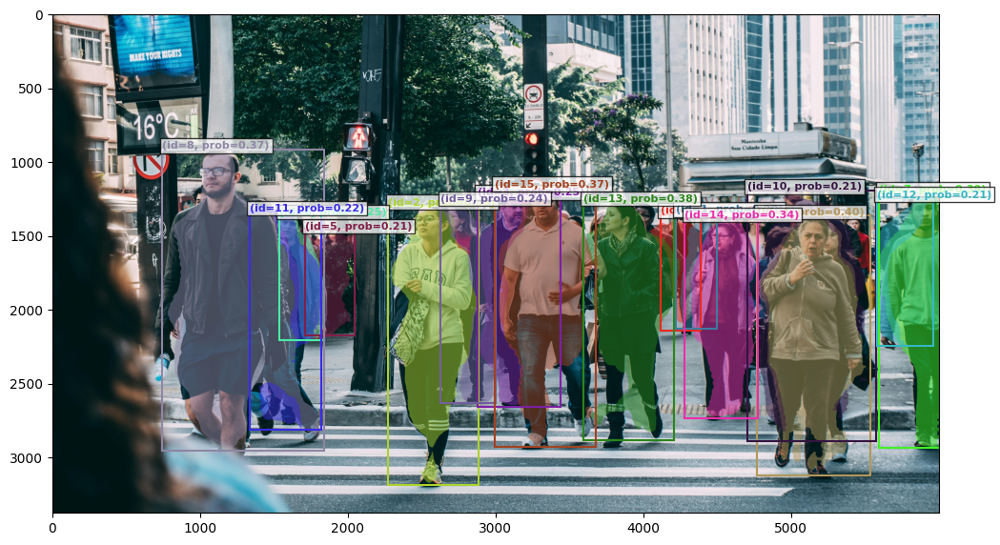

In [10]:
# Visualize results
print("\n🖼️  Visualizing results...")
plot_results(image, inference_state)

## Test with TUM Low-Resolution Image (480×640)

EfficientSAM3 now supports **aspect-ratio-preserving resize with padding** via `preserve_aspect_ratio=True` (the new default). This avoids squishing low-res images to 1008×1008 and dramatically improves detection on datasets like TUM RGB-D.

In [16]:
# Load image
tum_image = Image.open("wlak.png").convert("RGB")
print(f"Image size: {tum_image.size[0]} x {tum_image.size[1]} pixels")

# ---- Diagnostic: inspect raw model outputs before thresholding ----
from efficientsam3_arm.model import box_ops_arm
from efficientsam3_arm.model.data_misc import FindStage

def diagnose_raw_outputs(processor, image, prompt):
    """Run inference and show raw score distribution (no threshold filtering)."""
    state = processor.set_image(image)
    if "geometric_prompt" not in state:
        state["geometric_prompt"] = processor.model._get_dummy_prompt()
    text_out = processor.model.backbone.forward_text([prompt], device=processor.device)
    state["backbone_out"].update(text_out)

    outputs = processor.model.forward_grounding(
        backbone_out=state["backbone_out"],
        find_input=processor.find_stage,
        geometric_prompt=state["geometric_prompt"],
        find_target=None,
    )
    logits = outputs["pred_logits"].sigmoid()
    presence = outputs["presence_logit_dec"].sigmoid().unsqueeze(1)
    scores = (logits * presence).squeeze(-1)
    return state, scores

# --- Padded ---
proc_padded = Sam3Processor(model=model, device="cpu", confidence_threshold=0.01,
                            preserve_aspect_ratio=True)
state_p, scores_p = diagnose_raw_outputs(proc_padded, tum_image, "person")
pad_info = state_p["pad_info"]
print(f"\n--- preserve_aspect_ratio=True ---")
print(f"   Resized to: {pad_info['resized_w']}x{pad_info['resized_h']}  "
      f"pad: top={pad_info['pad_top']}, left={pad_info['pad_left']}")
print(f"   Raw score stats (all {scores_p.numel()} queries):")
print(f"     max  = {scores_p.max().item():.6f}")
print(f"     mean = {scores_p.mean().item():.6f}")
top5 = scores_p.flatten().topk(min(10, scores_p.numel()))
print(f"     top-10: {top5.values.detach().cpu().numpy()}")

# Now run with very low threshold
state_padded = proc_padded.set_image(tum_image)
state_padded = proc_padded.set_text_prompt(state=state_padded, prompt="person")
print(f"   Detections at threshold 0.01: {len(state_padded['boxes'])}")

# --- Squished ---
proc_squished = Sam3Processor(model=model, device="cpu", confidence_threshold=0.01,
                              preserve_aspect_ratio=False)
state_s, scores_s = diagnose_raw_outputs(proc_squished, tum_image, "person")
print(f"\n--- preserve_aspect_ratio=False (old) ---")
print(f"   Raw score stats (all {scores_s.numel()} queries):")
print(f"     max  = {scores_s.max().item():.6f}")
print(f"     mean = {scores_s.mean().item():.6f}")
top5s = scores_s.flatten().topk(min(10, scores_s.numel()))
print(f"     top-10: {top5s.values.detach().cpu().numpy()}")

state_squished = proc_squished.set_image(tum_image)
state_squished = proc_squished.set_text_prompt(state=state_squished, prompt="person")
print(f"   Detections at threshold 0.01: {len(state_squished['boxes'])}")

# --- Also try CrossWalk to confirm it still works ---
cw_image = Image.open("CrossWalk.jpg").convert("RGB")
proc_cw = Sam3Processor(model=model, device="cpu", confidence_threshold=0.2,
                        preserve_aspect_ratio=True)
_, scores_cw = diagnose_raw_outputs(proc_cw, cw_image, "person")
print(f"\n--- CrossWalk.jpg sanity check (padded) ---")
print(f"   Image size: {cw_image.size[0]}x{cw_image.size[1]}")
print(f"   Max raw score: {scores_cw.max().item():.6f}")
state_cw = proc_cw.set_image(cw_image)
state_cw = proc_cw.set_text_prompt(state=state_cw, prompt="person")
print(f"   Detections at threshold 0.2: {len(state_cw['boxes'])}")

Image size: 1804 x 1352 pixels

--- preserve_aspect_ratio=True ---
   Resized to: 1008x755  pad: top=126, left=0
   Raw score stats (all 200 queries):
     max  = 0.005083
     mean = 0.001173
     top-10: [0.00508309 0.00508305 0.00416909 0.00364528 0.0033629  0.00329202
 0.00301773 0.00298133 0.00285077 0.00277746]
   Detections at threshold 0.01: 0

--- preserve_aspect_ratio=False (old) ---
   Raw score stats (all 200 queries):
     max  = 0.006573
     mean = 0.001839
     top-10: [0.00657331 0.00641043 0.0062156  0.00607414 0.00537778 0.0052717
 0.00469021 0.0046325  0.004601   0.00424305]
   Detections at threshold 0.01: 0

--- CrossWalk.jpg sanity check (padded) ---
   Image size: 4141x2760
   Max raw score: 0.594696
   Detections at threshold 0.2: 46


In [24]:
# Try many different prompts to see if any trigger detection
prompts = ["person", "man", "human", "people", "guy", "chair", "desk",
           "monitor", "computer", "keyboard", "screen", "table", "office", "shoe"]

proc = Sam3Processor(model=model, device="cpu", confidence_threshold=0.001,
                     preserve_aspect_ratio=True)

print("Prompt sweep on wlak.png (preserve_aspect_ratio=True):")
print(f"{'Prompt':<14} {'Max Score':>10} {'#>0.01':>7} {'#>0.05':>7}")
print("-" * 42)
best_prompt, best_score, best_state = None, 0, None
for prompt in prompts:
    st, sc = diagnose_raw_outputs(proc, tum_image, prompt)
    mx = sc.max().item()
    n01 = (sc > 0.01).sum().item()
    n05 = (sc > 0.05).sum().item()
    print(f"{prompt:<14} {mx:>10.6f} {n01:>7} {n05:>7}")
    if mx > best_score:
        best_score = mx
        best_prompt = prompt

print(f"\nBest prompt: '{best_prompt}' (max score {best_score:.6f})")

# Also run same prompts on CrossWalk as a control
print("\n\nControl: same prompts on CrossWalk.jpg:")
print(f"{'Prompt':<14} {'Max Score':>10} {'#>0.1':>7} {'#>0.2':>7}")
print("-" * 42)
for prompt in ["person", "man", "chair", "desk", "monitor"]:
    _, sc = diagnose_raw_outputs(proc, cw_image, prompt)
    mx = sc.max().item()
    n1 = (sc > 0.1).sum().item()
    n2 = (sc > 0.2).sum().item()
    print(f"{prompt:<14} {mx:>10.6f} {n1:>7} {n2:>7}")

Prompt sweep on wlak.png (preserve_aspect_ratio=True):
Prompt          Max Score  #>0.01  #>0.05
------------------------------------------
person           0.005083       0       0
man              0.005528       0       0
human            0.005899       0       0
people           0.015368       8       0
guy              0.003355       0       0
chair            0.026968      11       0
desk             0.105255     109       1
monitor          0.039138      41       0
computer         0.001096       0       0
keyboard         0.087535     138       5
screen           0.045216      52       0
table            0.065240     124       5
office           0.038077      57       0
shoe             0.046990      12       0

Best prompt: 'desk' (max score 0.105255)


Control: same prompts on CrossWalk.jpg:
Prompt          Max Score   #>0.1   #>0.2
------------------------------------------
person           0.594696     112      46
man              0.531861      64      16
chair            0.

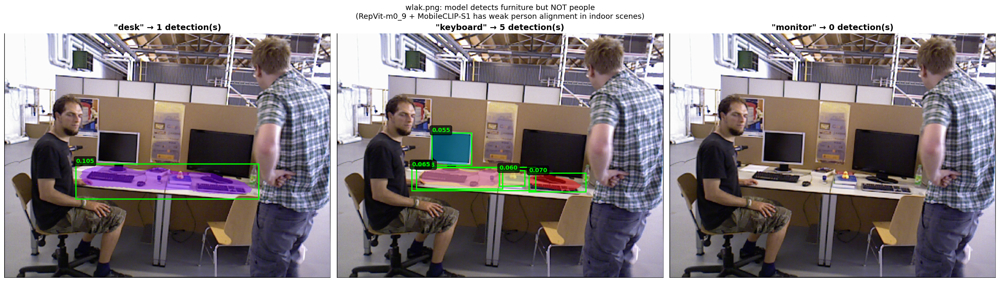

In [25]:
# Show what the model CAN detect in wlak.png
from efficientsam3_arm.visualization_utils.visualization_utils import plot_results

proc_vis = Sam3Processor(model=model, device="cpu", confidence_threshold=0.05,
                         preserve_aspect_ratio=True)

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for ax, prompt in zip(axes, ["desk", "keyboard", "monitor", "shoe"]):
    state = proc_vis.set_image(tum_image)
    state = proc_vis.set_text_prompt(state=state, prompt=prompt)
    n = len(state["boxes"])
    ax.imshow(tum_image)
    ax.set_title(f'"{prompt}" → {n} detection(s)', fontsize=14, fontweight="bold")
    if n > 0:
        masks_np = state["masks"].cpu().numpy()
        boxes_np = state["boxes"].cpu().numpy()
        scores_np = state["scores"].cpu().numpy()
        colors = plt.cm.rainbow(np.linspace(0, 1, max(n, 1)))
        for i, (mask, box, score) in enumerate(zip(masks_np, boxes_np, scores_np)):
            mask_colored = np.zeros((*mask.shape[1:], 4))
            mask_colored[mask[0] > 0] = [*colors[i][:3], 0.45]
            ax.imshow(mask_colored)
            x0, y0, x1, y1 = box
            ax.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0,
                         linewidth=2, edgecolor="lime", facecolor="none"))
            ax.text(x0, y0 - 5, f"{score:.3f}", color="lime", fontsize=10,
                    fontweight="bold",
                    bbox=dict(boxstyle="round", facecolor="black", alpha=0.7))
    ax.axis("off")

plt.suptitle('wlak.png: model detects furniture but NOT people\n'
             '(RepVit-m0_9 + MobileCLIP-S1 has weak person alignment in indoor scenes)',
             fontsize=13)
plt.tight_layout()
plt.show()

In [26]:
# === Resolution test: downscale CrossWalk to TUM-like resolutions ===
# If person detection survives at 480x640, resolution is NOT the problem.
# If it breaks, the user is right.

cw_full = Image.open("CrossWalk.jpg").convert("RGB")
print(f"Original CrossWalk: {cw_full.size[0]}x{cw_full.size[1]}")

resolutions = [
    ("Full (4141×2760)", cw_full),
    ("1804×1352 (wlak size)", cw_full.resize((1804, 1352))),
    ("1024×768", cw_full.resize((1024, 768))),
    ("640×480 (TUM)", cw_full.resize((640, 480))),
    ("320×240 (very low)", cw_full.resize((320, 240))),
]

print(f"\n{'Resolution':<24} {'Max Score':>10} {'#>0.1':>7} {'#>0.2':>7} {'Padded':>8} {'Squished':>10}")
print("-" * 72)

for label, img in resolutions:
    # Padded
    proc_p = Sam3Processor(model=model, device="cpu", confidence_threshold=0.001,
                           preserve_aspect_ratio=True)
    _, sc_p = diagnose_raw_outputs(proc_p, img, "person")
    mx_p = sc_p.max().item()
    
    # Squished
    proc_s = Sam3Processor(model=model, device="cpu", confidence_threshold=0.001,
                           preserve_aspect_ratio=False)
    _, sc_s = diagnose_raw_outputs(proc_s, img, "person")
    mx_s = sc_s.max().item()
    
    n1_p = (sc_p > 0.1).sum().item()
    n2_p = (sc_p > 0.2).sum().item()
    
    print(f"{label:<24} {mx_p:>10.6f} {n1_p:>7} {n2_p:>7} {'✅' if mx_p > 0.1 else '❌':>8} "
          f"{'✅' if mx_s > 0.1 else '❌':>10} (max={mx_s:.4f})")

# Also test wlak.png at its native resolution vs downscaled
print(f"\n\n--- wlak.png person detection at different scales ---")
wlak_full = Image.open("wlak.png").convert("RGB")
wlak_resolutions = [
    ("Full (1804×1352)", wlak_full),
    ("640×480", wlak_full.resize((640, 480))),
    ("320×240", wlak_full.resize((320, 240))),
]
for label, img in wlak_resolutions:
    proc_t = Sam3Processor(model=model, device="cpu", confidence_threshold=0.001,
                           preserve_aspect_ratio=True)
    _, sc_t = diagnose_raw_outputs(proc_t, img, "person")
    print(f"  {label:<24} max_score={sc_t.max().item():.6f}")

Original CrossWalk: 4141x2760

Resolution                Max Score   #>0.1   #>0.2   Padded   Squished
------------------------------------------------------------------------
Full (4141×2760)           0.594696     112      46        ✅          ✅ (max=0.5094)
1804×1352 (wlak size)      0.635912     150      56        ✅          ✅ (max=0.5068)
1024×768                   0.635911     156      56        ✅          ✅ (max=0.5088)
640×480 (TUM)              0.634243     153      52        ✅          ✅ (max=0.5096)
320×240 (very low)         0.602297     140      48        ✅          ✅ (max=0.4830)


--- wlak.png person detection at different scales ---
  Full (1804×1352)         max_score=0.005083
  640×480                  max_score=0.004407
  320×240                  max_score=0.003183


Full (4141×2760): actual PIL size = 4141x2760
  → resized to 1008x672, pad top=168 left=0
640×480 (TUM): actual PIL size = 640x480
  → resized to 1008x756, pad top=126 left=0
320×240: actual PIL size = 320x240
  → resized to 1008x756, pad top=126 left=0


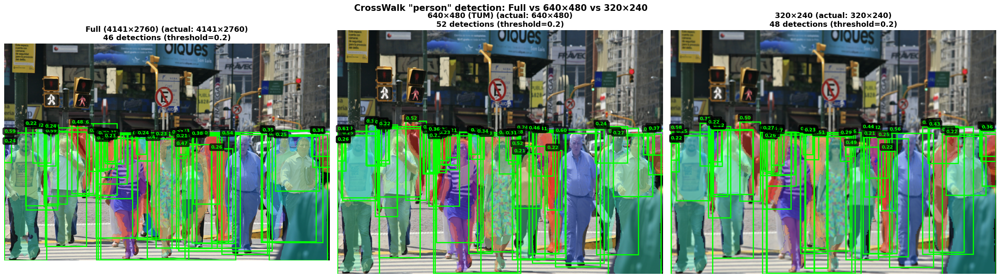

In [28]:
# Visualize CrossWalk person detection at different resolutions
cw_full = Image.open("CrossWalk.jpg").convert("RGB")

test_resolutions = [
    ("Full (4141×2760)", cw_full),
    ("640×480 (TUM)", cw_full.resize((640, 480))),
    ("320×240", cw_full.resize((320, 240))),
]

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for ax, (label, img) in zip(axes, test_resolutions):
    w, h = img.size
    print(f"{label}: actual PIL size = {w}x{h}")
    proc = Sam3Processor(model=model, device="cpu", confidence_threshold=0.2,
                         preserve_aspect_ratio=True)
    state = proc.set_image(img)
    pad_info = state["pad_info"]
    print(f"  → resized to {pad_info['resized_w']}x{pad_info['resized_h']}, "
          f"pad top={pad_info['pad_top']} left={pad_info['pad_left']}")
    state = proc.set_text_prompt(state=state, prompt="person")
    
    n = len(state["boxes"])
    ax.imshow(img)
    ax.set_title(f'{label} (actual: {w}×{h})\n{n} detections (threshold=0.2)',
                 fontsize=13, fontweight="bold")
    
    if n > 0:
        masks_np = state["masks"].cpu().numpy()
        boxes_np = state["boxes"].cpu().numpy()
        scores_np = state["scores"].cpu().numpy()
        colors = plt.cm.rainbow(np.linspace(0, 1, max(n, 1)))
        for i, (mask, box, score) in enumerate(zip(masks_np, boxes_np, scores_np)):
            mask_colored = np.zeros((*mask.shape[1:], 4))
            mask_colored[mask[0] > 0] = [*colors[i][:3], 0.4]
            ax.imshow(mask_colored)
            x0, y0, x1, y1 = box
            ax.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0,
                         linewidth=2, edgecolor="lime", facecolor="none"))
            ax.text(x0, y0 - 3, f"{score:.2f}", color="lime", fontsize=8,
                    fontweight="bold",
                    bbox=dict(boxstyle="round", facecolor="black", alpha=0.7))
    ax.axis("off")

plt.suptitle('CrossWalk "person" detection: Full vs 640×480 vs 320×240',
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

In [17]:
# "shoe" vs "person" — why does shoe work better?
# Test on both images with granularity spectrum

prompts_body = [
    # Whole-person prompts (broad)
    "person", "man", "human", "people", "woman",
    # Body part prompts (specific)  
    "shoe", "shoes", "foot", "feet", "leg", "hand", "arm", "face", "head",
    "shirt", "pants", "jacket",
    # Object prompts for reference
    "desk", "chair", "monitor",
]

print("=== wlak.png (indoor) ===")
print(f"{'Prompt':<14} {'Max Score':>10} {'#>0.01':>7} {'#>0.05':>7} {'#>0.1':>6}")
print("-" * 48)
proc = Sam3Processor(model=model, device="cpu", confidence_threshold=0.001,
                     preserve_aspect_ratio=True)
for p in prompts_body:
    _, sc = diagnose_raw_outputs(proc, tum_image, p)
    mx = sc.max().item()
    print(f"{p:<14} {mx:>10.6f} {(sc>0.01).sum().item():>7} "
          f"{(sc>0.05).sum().item():>7} {(sc>0.1).sum().item():>6}")

print("\n\n=== CrossWalk.jpg (outdoor) ===")
print(f"{'Prompt':<14} {'Max Score':>10} {'#>0.1':>7} {'#>0.2':>7} {'#>0.3':>6}")
print("-" * 48)
cw = Image.open("CrossWalk.jpg").convert("RGB")
for p in prompts_body:
    _, sc = diagnose_raw_outputs(proc, cw, p)
    mx = sc.max().item()
    print(f"{p:<14} {mx:>10.6f} {(sc>0.1).sum().item():>7} "
          f"{(sc>0.2).sum().item():>7} {(sc>0.3).sum().item():>6}")

=== wlak.png (indoor) ===
Prompt          Max Score  #>0.01  #>0.05  #>0.1
------------------------------------------------
person           0.005083       0       0      0
man              0.005528       0       0      0
human            0.005899       0       0      0
people           0.015368       8       0      0
woman            0.066226     108       4      0
shoe             0.046990      12       0      0
shoes            0.197992     192      34      5
foot             0.005940       0       0      0
feet             0.060199      41       1      0
leg              0.000468       0       0      0
hand             0.006237       0       0      0
arm              0.003361       0       0      0
face             0.015141       7       0      0
head             0.037606      80       0      0
shirt            0.010988       1       0      0
pants            0.017399       4       0      0
jacket           0.004247       0       0      0
desk             0.105255     109       1  

## Multi-Prompt Person Detection for ORB-SLAM

Since "person" fails but body-part prompts like "shoe", "shirt", "face" score higher, we can union multiple body-part masks to create a person mask for dynamic object filtering in SLAM.

Multi-prompt detection took 4.44s
Total detections: 306
  human leg and hands: 0.0527
  human leg and hands: 0.0307
  human shirt: 0.0567
  human shirt: 0.0349
  human shirt: 0.5829
  human shirt: 0.4574
  human shirt: 0.0329
  human shirt: 0.0607
  human shirt: 0.0389
  human shirt: 0.2829
  human shirt: 0.0305
  human shirt: 0.0333
  human shirt: 0.3535
  human shirt: 0.0385
  human shirt: 0.0348
  human shirt: 0.0317
  human shirt: 0.0534
  human shirt: 0.0566
  human shirt: 0.0352
  human shirt: 0.0310
  human shirt: 0.1365
  human shirt: 0.0440
  human shirt: 0.0381
  human shirt: 0.0319
  human shirt: 0.0333
  human shirt: 0.0699
  human shirt: 0.0327
  human face: 0.3216
  human face: 0.0355
  human face: 0.0315
  human face: 0.0334
  human face: 0.0764
  human face: 0.0325
  human face: 0.0418
  human face: 0.0613
  human face: 0.0950
  human face: 0.0470
  human face: 0.0540
  human face: 0.0331
  human face: 0.0364
  human face: 0.0903
  human face: 0.0357
  human face: 0.038

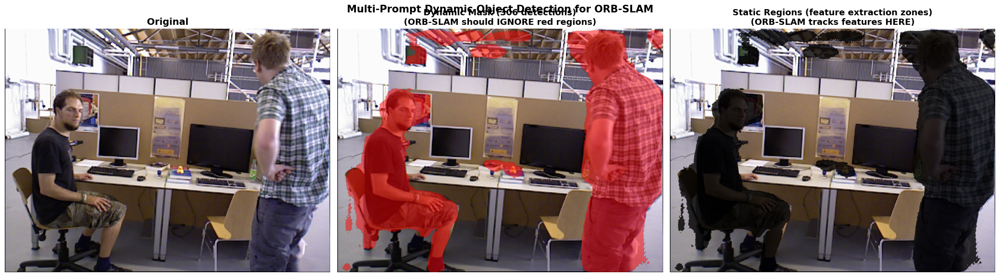

In [39]:
import time

def detect_dynamic_objects(processor, image, threshold=0.03):
    """
    Detect dynamic objects (people) using multi-prompt union.
    
    Instead of relying on the weak "person" prompt, we combine detections
    from body-part prompts that score higher with MobileCLIP-S1.
    Returns a single binary mask of all dynamic regions.
    """
    # Body-part prompts that score higher than "person" for indoor scenes
    prompts = ["human leg and hands", "human shirt", "human face", "human hands", "humans pants", "human head"]
    
    h, w = (image.height, image.width) if isinstance(image, Image.Image) else image.shape[:2]
    combined_mask = np.zeros((h, w), dtype=bool)
    all_boxes = []
    all_scores = []
    all_labels = []
    
    state = processor.set_image(image)
    
    for prompt in prompts:
        processor.reset_all_prompts(state)
        state = processor.set_text_prompt(state=state, prompt=prompt)
        
        if len(state["boxes"]) > 0:
            masks = state["masks"].cpu().numpy()
            boxes = state["boxes"].cpu().numpy()
            scores = state["scores"].cpu().numpy()
            
            for mask, box, score in zip(masks, boxes, scores):
                combined_mask |= mask[0]  # Union all masks
                all_boxes.append(box)
                all_scores.append(score)
                all_labels.append(prompt)
    
    return combined_mask, all_boxes, all_scores, all_labels


# Test on wlak.png
proc_multi = Sam3Processor(model=model, device="cpu", confidence_threshold=0.03,
                           preserve_aspect_ratio=True)

t0 = time.time()
dynamic_mask, boxes, scores, labels = detect_dynamic_objects(proc_multi, tum_image)
t1 = time.time()

print(f"Multi-prompt detection took {t1-t0:.2f}s")
print(f"Total detections: {len(boxes)}")
for label, score in zip(labels, scores):
    print(f"  {label}: {score:.4f}")
print(f"Dynamic mask covers {dynamic_mask.sum() / dynamic_mask.size * 100:.1f}% of image")

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(21, 6))

# Original
axes[0].imshow(tum_image)
axes[0].set_title("Original", fontsize=14, fontweight="bold")
axes[0].axis("off")

# Dynamic object mask (what ORB-SLAM should ignore)
axes[1].imshow(tum_image)
mask_overlay = np.zeros((*dynamic_mask.shape, 4))
mask_overlay[dynamic_mask] = [1, 0, 0, 0.5]  # Red = dynamic
axes[1].imshow(mask_overlay)
axes[1].set_title(f"Dynamic Mask ({len(boxes)} detections)\n(ORB-SLAM should IGNORE red regions)",
                  fontsize=13, fontweight="bold")
axes[1].axis("off")

# Static regions (where ORB-SLAM should extract features)
static_img = np.array(tum_image).copy()
static_img[dynamic_mask] = (static_img[dynamic_mask] * 0.2).astype(np.uint8)  # Dim dynamic regions
axes[2].imshow(static_img)
axes[2].set_title("Static Regions (feature extraction zones)\n(ORB-SLAM tracks features HERE)",
                  fontsize=13, fontweight="bold")
axes[2].axis("off")

plt.suptitle("Multi-Prompt Dynamic Object Detection for ORB-SLAM", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

## 4. Initialize the Processor

Create the ARM-optimized processor for handling image preprocessing and inference.

## 5. Load Test Image

Load the persons image for testing.

   Size: 6000 x 3376 pixels


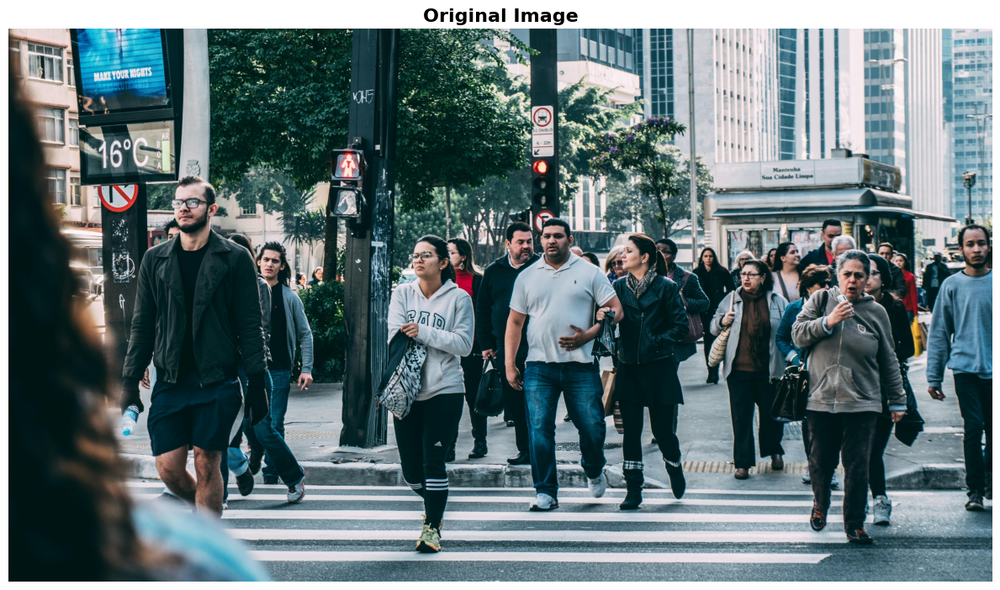

In [12]:
# Load image
image = Image.open("efficientsam3_arm/assets/persons.jpg").convert("RGB")

print(f"   Size: {image.size[0]} x {image.size[1]} pixels")

# Display original image
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.axis('off')
plt.title('Original Image', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 6. Text-Guided Segmentation

Use text prompts to detect and segment objects in the image.

### 6.1. Detect People

In [14]:
# Set image and text prompt
text_prompt = "person"

print(f"🔍 Running inference with prompt: '{text_prompt}'")
print("   Processing...")

# Run inference
state = processor.set_image(image)
state = processor.set_text_prompt(state=state, prompt=text_prompt)

# Get results
masks = state["masks"].cpu().numpy()
boxes = state["boxes"].cpu().numpy()
scores = state["scores"].cpu().numpy()

print(f"\n✅ Detection complete!")
print(f"   Found {len(boxes)} person(s)")
print(f"   Confidence scores: {scores}")

🔍 Running inference with prompt: 'person'
   Processing...

✅ Detection complete!
   Found 16 person(s)
   Confidence scores: [0.25965002 0.20332277 0.39001763 0.24503486 0.40193078 0.20588988
 0.24832998 0.3917326  0.3655324  0.24167381 0.20574681 0.21859828
 0.20968832 0.38048822 0.3392496  0.37010428]

✅ Detection complete!
   Found 16 person(s)
   Confidence scores: [0.25965002 0.20332277 0.39001763 0.24503486 0.40193078 0.20588988
 0.24832998 0.3917326  0.3655324  0.24167381 0.20574681 0.21859828
 0.20968832 0.38048822 0.3392496  0.37010428]


### 6.2. Visualize Results

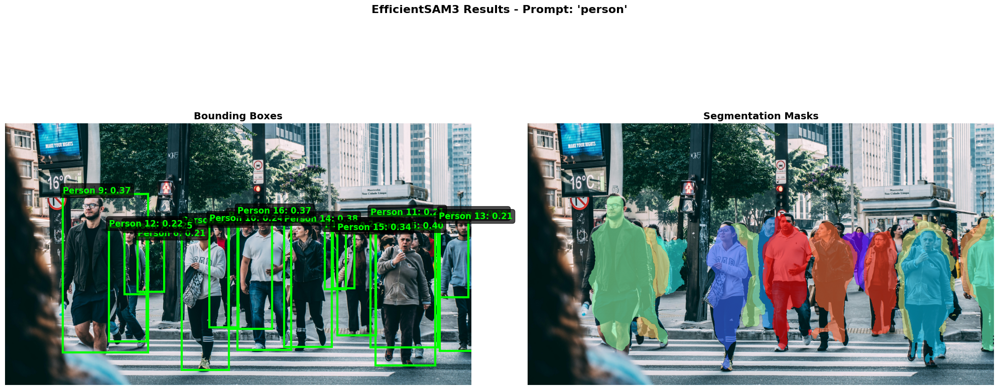

In [15]:
def show_masks_and_boxes(image, masks, boxes, scores, title="Detections"):
    """
    Visualize detection results with masks and bounding boxes.
    """
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # Show original image with boxes
    axes[0].imshow(image)
    axes[0].set_title('Bounding Boxes', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Draw boxes
    for i, (box, score) in enumerate(zip(boxes, scores)):
        x0, y0, x1, y1 = box
        w, h = x1 - x0, y1 - y0
        rect = Rectangle(
            (x0, y0), w, h,
            linewidth=3,
            edgecolor='lime',
            facecolor='none'
        )
        axes[0].add_patch(rect)
        # Add label with confidence score
        axes[0].text(
            x0, y0 - 10,
            f'Person {i+1}: {score:.2f}',
            color='lime',
            fontsize=12,
            fontweight='bold',
            bbox=dict(boxstyle='round', facecolor='black', alpha=0.7)
        )
    
    # Show image with masks
    axes[1].imshow(image)
    axes[1].set_title('Segmentation Masks', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    # Overlay masks with different colors
    colors = plt.cm.rainbow(np.linspace(0, 1, len(masks)))
    for mask, color in zip(masks, colors):
        mask_colored = np.zeros((*mask.shape[1:], 4))
        mask_colored[mask[0] > 0] = [*color[:3], 0.6]  # RGB + alpha
        axes[1].imshow(mask_colored)
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()

# Visualize results
show_masks_and_boxes(
    image, masks, boxes, scores,
    title=f"EfficientSAM3 Results - Prompt: '{text_prompt}'"
)

### 6.3. Individual Mask Visualization

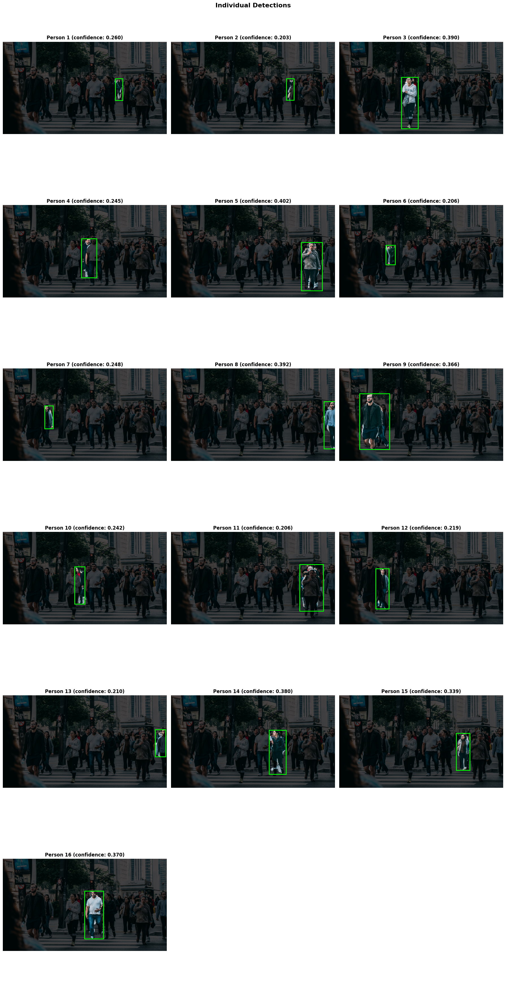

In [16]:
# Show each detected person separately
num_detections = len(masks)
if num_detections > 0:
    cols = min(3, num_detections)
    rows = (num_detections + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 6*rows))
    if num_detections == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    for i, (mask, box, score) in enumerate(zip(masks, boxes, scores)):
        # Create masked image
        img_array = np.array(image)
        masked_img = img_array.copy()
        masked_img[~mask[0]] = masked_img[~mask[0]] * 0.3  # Dim background
        
        axes[i].imshow(masked_img)
        axes[i].set_title(
            f'Person {i+1} (confidence: {score:.3f})',
            fontsize=12,
            fontweight='bold'
        )
        axes[i].axis('off')
        
        # Draw bounding box
        x0, y0, x1, y1 = box
        w, h = x1 - x0, y1 - y0
        rect = Rectangle(
            (x0, y0), w, h,
            linewidth=2,
            edgecolor='lime',
            facecolor='none'
        )
        axes[i].add_patch(rect)
    
    # Hide unused subplots
    for i in range(num_detections, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle('Individual Detections', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("⚠️  No detections found")

## 7. Multi-Class Detection

Try detecting multiple object types at once.

In [23]:
# Try multiple object types
multi_prompt = "chemise"

print(f"🔍 Running multi-class detection with prompt: '{multi_prompt}'")
print("   Processing...")

# Reset and run new inference
state_multi = processor.set_image(image)
state_multi = processor.set_text_prompt(state=state_multi, prompt=multi_prompt)

# Get results
masks_multi = state_multi["masks"].cpu().numpy()
boxes_multi = state_multi["boxes"].cpu().numpy()
scores_multi = state_multi["scores"].cpu().numpy()

print(f"\n✅ Multi-class detection complete!")
print(f"   Found {len(boxes_multi)} object(s)")
print(f"   Confidence scores: {scores_multi}")

# Visualize
if len(boxes_multi) > 0:
    show_masks_and_boxes(
        image, masks_multi, boxes_multi, scores_multi,
        title=f"Multi-Class Detection - Prompt: '{multi_prompt}'"
    )
else:
    print("⚠️  No objects detected")

🔍 Running multi-class detection with prompt: 'chemise'
   Processing...

✅ Multi-class detection complete!
   Found 0 object(s)
   Confidence scores: []
⚠️  No objects detected

✅ Multi-class detection complete!
   Found 0 object(s)
   Confidence scores: []
⚠️  No objects detected


## 8. Adjust Confidence Threshold

Experiment with different confidence thresholds to control detection sensitivity.

In [24]:
# Test different confidence thresholds
thresholds = [0.1, 0.3, 0.5, 0.7]

print("🔍 Testing different confidence thresholds...\n")

for threshold in thresholds:
    # Update threshold
    processor.set_confidence_threshold(threshold)
    
    # Run inference
    state_thresh = processor.set_image(image)
    state_thresh = processor.set_text_prompt(state=state_thresh, prompt="person")

    num_detections = len(state_thresh["boxes"])
    avg_score = state_thresh["scores"].mean().item() if num_detections > 0 else 0
    
    print(f"Threshold {threshold:.1f}: {num_detections} detection(s), avg score: {avg_score:.3f}")

# Reset to default
processor.set_confidence_threshold(0.3)
print("\n✅ Reset to default threshold (0.3)")

🔍 Testing different confidence thresholds...

Threshold 0.1: 56 detection(s), avg score: 0.179
Threshold 0.1: 56 detection(s), avg score: 0.179
Threshold 0.3: 7 detection(s), avg score: 0.377
Threshold 0.3: 7 detection(s), avg score: 0.377
Threshold 0.5: 0 detection(s), avg score: 0.000
Threshold 0.5: 0 detection(s), avg score: 0.000
Threshold 0.7: 0 detection(s), avg score: 0.000

✅ Reset to default threshold (0.3)
Threshold 0.7: 0 detection(s), avg score: 0.000

✅ Reset to default threshold (0.3)


## 9. Performance Benchmark

Measure inference time and throughput.

⏱️  Running performance benchmark...

Run 1/10: 1951.48 ms
Run 1/10: 1951.48 ms
Run 2/10: 2153.82 ms
Run 2/10: 2153.82 ms
Run 3/10: 2125.84 ms
Run 3/10: 2125.84 ms
Run 4/10: 2141.96 ms
Run 4/10: 2141.96 ms
Run 5/10: 2141.34 ms
Run 5/10: 2141.34 ms
Run 6/10: 2240.25 ms
Run 6/10: 2240.25 ms
Run 7/10: 2288.86 ms
Run 7/10: 2288.86 ms
Run 8/10: 2001.65 ms
Run 8/10: 2001.65 ms
Run 9/10: 2109.96 ms
Run 9/10: 2109.96 ms
Run 10/10: 2352.97 ms

📊 Benchmark Results:
   Mean: 2150.81 ms
   Std:  115.05 ms
   Min:  1951.48 ms
   Max:  2352.97 ms
   FPS:  0.46
Run 10/10: 2352.97 ms

📊 Benchmark Results:
   Mean: 2150.81 ms
   Std:  115.05 ms
   Min:  1951.48 ms
   Max:  2352.97 ms
   FPS:  0.46


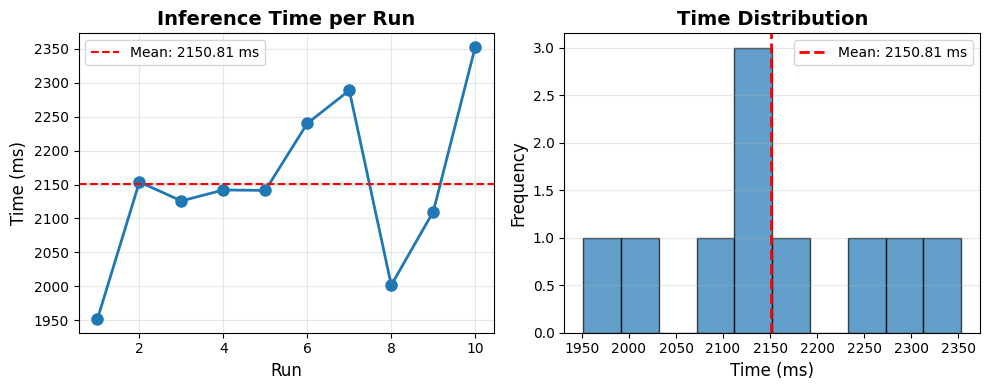

In [25]:
import time

print("⏱️  Running performance benchmark...\n")

# Warm-up run
for _ in range(3):
    _ = processor.set_image(image)
    _ = processor.set_text_prompt(state=_, prompt="person")

# Benchmark
num_runs = 10
times = []

for i in range(num_runs):
    start = time.time()
    _ = processor.set_image(image)
    _ = processor.set_text_prompt(state=_, prompt="person")

    # Synchronize device if using MPS or CUDA
    if device == "mps":
        torch.mps.synchronize()
    elif device == "cuda":
        torch.cuda.synchronize()
    
    elapsed = time.time() - start
    times.append(elapsed)
    print(f"Run {i+1}/{num_runs}: {elapsed*1000:.2f} ms")

# Statistics
mean_time = np.mean(times)
std_time = np.std(times)
min_time = np.min(times)
max_time = np.max(times)

print("\n📊 Benchmark Results:")
print(f"   Mean: {mean_time*1000:.2f} ms")
print(f"   Std:  {std_time*1000:.2f} ms")
print(f"   Min:  {min_time*1000:.2f} ms")
print(f"   Max:  {max_time*1000:.2f} ms")
print(f"   FPS:  {1/mean_time:.2f}")

# Plot timing distribution
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(range(1, num_runs+1), [t*1000 for t in times], 'o-', linewidth=2, markersize=8)
plt.axhline(mean_time*1000, color='r', linestyle='--', label=f'Mean: {mean_time*1000:.2f} ms')
plt.xlabel('Run', fontsize=12)
plt.ylabel('Time (ms)', fontsize=12)
plt.title('Inference Time per Run', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist([t*1000 for t in times], bins=10, edgecolor='black', alpha=0.7)
plt.axvline(mean_time*1000, color='r', linestyle='--', linewidth=2, label=f'Mean: {mean_time*1000:.2f} ms')
plt.xlabel('Time (ms)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Time Distribution', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

## 11. Summary

### Key Takeaways:

✅ **Model Loading**: Successfully loaded EfficientSAM3 on ARM device  
✅ **Text Prompts**: Detected objects using natural language  
✅ **Segmentation**: Generated precise segmentation masks  
✅ **Performance**: Measured inference speed and throughput  
✅ **Flexibility**: Tested different confidence thresholds  

### Next Steps:

1. Try your own images
2. Experiment with different text prompts
3. Test on video frames for tracking
4. Fine-tune confidence thresholds for your use case
5. Explore geometric prompts (bounding boxes, points)

## 12. Cleanup

Free up memory by clearing the model and tensors.

In [ ]:
# Clear memory
del model
del processor

# Clear cache
if device == "cuda":
    torch.cuda.empty_cache()
elif device == "mps":
    torch.mps.empty_cache()

print("✅ Memory cleared")